# Rikitake attractor
### Kirill Zakharov

In [1]:
import numpy as np
from scipy.integrate import odeint
import plotly.graph_objects as go
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline

In [2]:
def runge_Kutt(f, g, u, t0, x0, y0, z0, h, b):
    t = t0
    x = x0
    y = y0
    z = z0
    arrayX = np.array([])
    arrayY = np.array([])
    arrayT = np.array([])
    arrayZ = np.array([])
    while t<b:
        k1 = g(t, x, y, z)
        q1 = f(t, x, y, z)
        p1 = u(t, x, y, z)
        
        k2 = g(t + h/2, x + (h*q1)/2, y + (h*k1)/2, z + (h*p1)/2)
        q2 = f(t + h/2, x + (h*q1)/2, y + (h*k1)/2, z + (h*p1)/2)
        p2 = u(t + h/2, x + (h*q1)/2, y + (h*k1)/2, z + (h*p1)/2)
        
        k3 = g(t + h/2, x + (h*q2)/2, y + (h*k2)/2, z + (h*p2)/2)
        q3 = f(t + h/2, x + (h*q2)/2, y + (h*k2)/2, z + (h*p2)/2)
        p3 = u(t + h/2, x + (h*q2)/2, y + (h*k2)/2, z + (h*p2)/2)
        
        k4 = g(t + h, x + h*q3, y + h*k3, z + h*p3)
        q4 = f(t + h, x + h*q3, y + h*k3, z + h*p3)
        p4 = u(t + h, x + h*q3, y + h*k3, z + h*p3)
        
        y = y + h*(k1 + 2*k2 + 2*k3 + k4)/6
        x = x + h*(q1 + 2*q2 + 2*q3 + q4)/6
        z = z + h*(p1 + 2*p2 + 2*p3 + p4)/6
        
        arrayX = np.append(arrayX, x)
        arrayT = np.append(arrayT, t)
        arrayY = np.append(arrayY, y)
        arrayZ = np.append(arrayZ, z)
        
        t += h
    return arrayT, arrayX, arrayY, arrayZ

In [84]:
#parameters
# mu = 1.2 #two disks
# a = 0.9
# mu = 0.2
# a = 0.5
# mu = 2.3
# a = 1
# mu = 0.498 #saddle and spiral sink
# a = 1
mu = 1 #spiral sink
a = 23

#system of equations for R-K method
def f(t, x, y, z):
    return -mu*x + y*z
def g(t, x, y, z):
    return -mu*y + x*(z-a)
def u(t, x, y, z):    
    return 1 - x*y
t0 = 0
x0 = 1
y0 = 1
z0 = 1
# p1, p2, p3, p4 = runge_Kutt(f, g, u, t0, x0, y0, z0, 0.001, 100)

## Visualization

In [85]:
#the system
def Rikitake(XYZ, t, mu, a):
    x, y, z = XYZ
    x_dt = -mu*x + y*z
    y_dt = -mu*y + x*(z-a)
    z_dt = 1 - x*y
    return x_dt, y_dt, z_dt


x_0, y_0, z_0= 1, 1, 0

tmax, n = 100, 50000

t = np.linspace(0, tmax, n)
f = odeint(Rikitake, (x_0, y_0, z_0), t, args=(mu, a))
X, Y, Z = f.T

#colors
c = np.linspace(0, 1, n)

DATA = go.Scatter3d(x=X, y=Y, z=Z,
                    line=dict(color= c,
                              width=3,
                              colorscale="Reds"),
                    mode='lines')

fig = go.Figure(data=DATA)    

fig.update_layout(width=800, height=800,
                  margin=dict(r=10, l=10, b=10, t=10),
                  # Устанавливаем цвет фона:
                  paper_bgcolor='rgb(0,0,0)',
                  scene=dict(camera=dict(up=dict(x=0, y=0, z=1),
                                         eye=dict(x=0, y=1, z=1)),
                             aspectratio = dict(x=1, y=1, z=1),
                             aspectmode = 'manual',

                             xaxis=dict(visible=False),
                             yaxis=dict(visible=False),
                             zaxis=dict(visible=False)
                            )
                 )
fig.show()

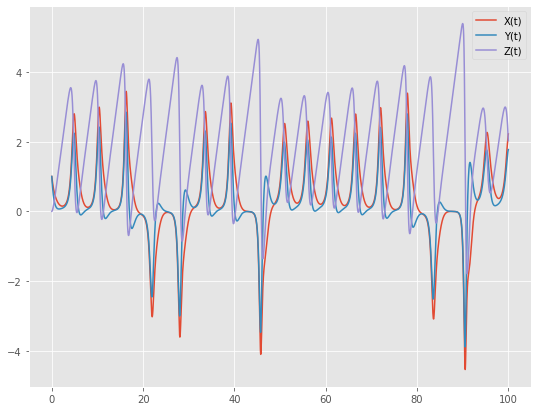

In [26]:
fig, ax = plt.subplots(figsize=(9,7))
plt.plot(t, X, label='X(t)')
plt.plot(t, Y, label='Y(t)')
plt.plot(t, Z, label='Z(t)')
plt.legend(loc=1)
plt.show()

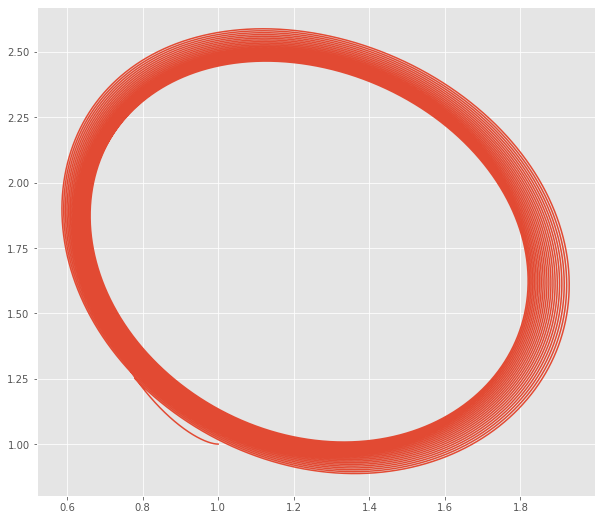

In [60]:
fig, ax = plt.subplots(figsize=(10,9))
plt.plot(p2, p4)
plt.show()

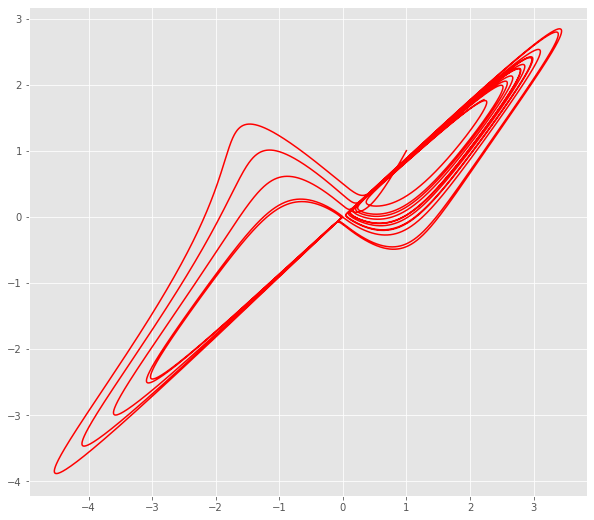

In [27]:
fig, ax = plt.subplots(figsize=(10,9))
plt.plot(X,Y, c='r')
plt.show()

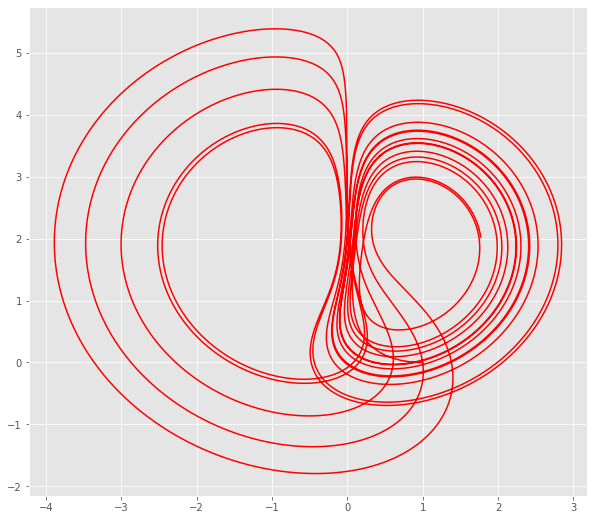

In [28]:
fig, ax = plt.subplots(figsize=(10,9))
plt.plot(Y, Z, c='r')
plt.show()

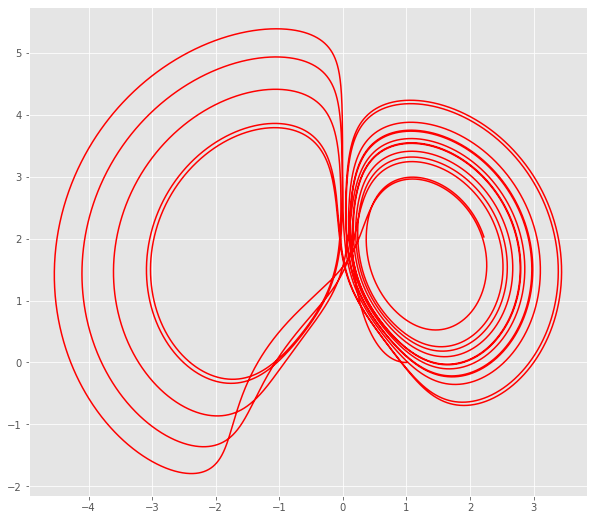

In [29]:
fig, ax = plt.subplots(figsize=(10,9))
plt.plot(X, Z, c='r')
plt.show()

## Vector graphics

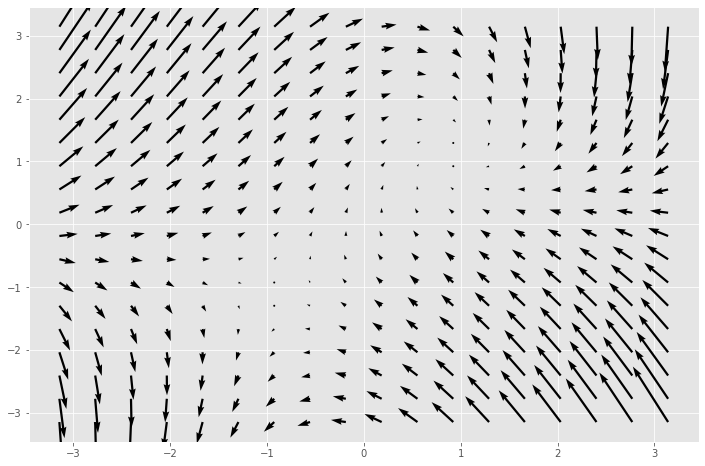

In [58]:
fig, ax = plt.subplots(figsize=(12,8))
x, y = np.mgrid[-np.pi:np.pi:18j,
                -np.pi:np.pi:18j]

u =  -mu*x + y*1
v = -mu*y + x*(1-a)
r = 1 - x*y
#vector field
ax.quiver(x, y, u, r, color='black')
plt.show()

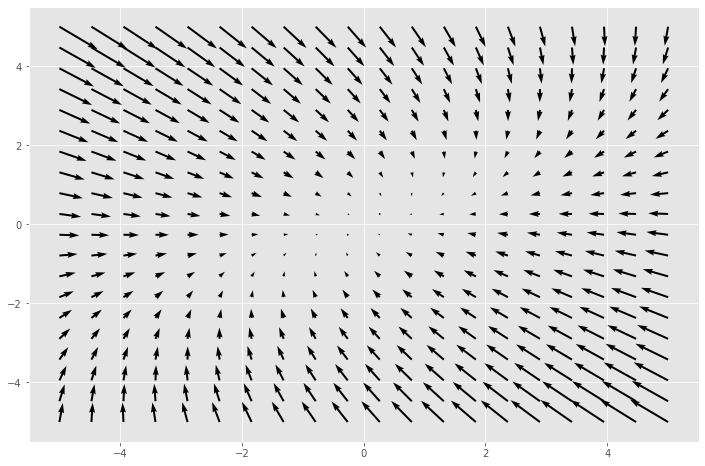

In [59]:
fig, ax = plt.subplots(figsize=(12,8))
x, y= np.mgrid[-5:5:20j,
                -5:5:20j]

u =  -mu*x + y*1
v = -mu*y + x*(1-a)
r = 1 - x*y
#vector field
ax.quiver(x, y, u, v, color='black')
plt.show()